<a href="https://colab.research.google.com/github/ankit-rathi/quantvesting_v3/blob/main/notebooks/14_Relative_Strength_Pullback_TopN_60M_SIP_JOURNEY_POSITION_RISK_INDIAN_RUPEE_EQUAL_CASH_REDEPLOYMENT_LATEST_APPLE_TO_APPLE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Relative Strength + Pullback Top-N — 60-Month SIP Journey

This notebook implements the **Relative Strength + Pullback Top-N** portfolio journey using point-in-time monthly signals and next-month execution. It is designed to be self-contained, reproducible, auditable, and directly comparable with the finalized 07–13 standalone notebooks.

### Core strategy
- Monthly screen identifies stocks with positive long-term trend support that have strong **cross-sectional relative strength** but are temporarily pulling back from their recent 52-week high.
- Trend filter: Close must be above the 200-DMA. This avoids treating persistent long-term downtrends as pullbacks.
- Relative strength is measured from **6-month and 12-month price returns with a 21-trading-day skip** (6M-1M and 12M-1M momentum), calculated only from information available on the screen date.
- Pullback requirement: price is at least the configured percentage below its trailing 252-trading-day high.
- Eligible stocks are ranked by a configurable composite of 6M relative-strength rank, 12M relative-strength rank, and pullback rank.
- Default research specification: 30% 6M RS + 30% 12M RS + 40% pullback. Relative-strength components therefore contribute 60% and pullback contributes 40%.
- Use the prior month-end screen to make purchases on the next month's first trading-day open.
- Maximum MAX_HOLDINGS open positions.
- Position cap limits **new purchases/additions**; appreciated winners are not automatically sold at 5%.
- Positions above the hard concentration threshold are partially trimmed on the next month's first trading day toward the trim target.
- Sector cap limits **new purchases**; price appreciation may subsequently take it above the cap.
- Indian cash-equity quantities are **whole shares only**.
- Internal BUY/TRIM transactions are not investor cash flows for XIRR; only contributions and the terminal portfolio value are external cash flows.

> **Important:** Run this notebook from top to bottom in a fresh runtime. All parameters are defined inside the notebook; no previous notebook state is required.

**Strategy rule:** At each prior-EOD monthly screen, a stock must be above its 200-DMA and at least 10% below its trailing 252-trading-day high. Eligible stocks are ranked by a point-in-time composite of 6M-1M relative strength, 12M-1M relative strength, and pullback strength; conviction is only a tie-break. Purchases execute at the next trading-day open under the common 40-holding / 5%-position / 20%-sector / 5%-cash / integer-share controls used by the apple-to-apple standalone notebooks.


## Apple-to-apple capital utilization policy

Both strategy notebooks use the same portfolio-construction utilization rule: **retain 5% of current portfolio value as strategic cash and deploy excess cash whenever qualifying opportunities have capacity**. A holding may be topped up while below the 5% stock cap; a new holding can only be opened while the portfolio is below the 20-stock maximum; new purchases remain subject to the 20% sector cap and whole-share execution. If the strategy has fewer eligible opportunities or integer-share/sector constraints prevent further deployment, the residual cash is retained. This isolates the stock-selection/exit logic as the strategy difference rather than allowing different cash-utilization mechanics. Cash utilization and turnover should be reported separately because high turnover can increase transaction costs even when capital is efficiently reused. citeturn0search0turn0search6

## 1. Dependencies

In [1]:
# If needed in Colab: %pip install yfinance pandas numpy matplotlib

from pathlib import Path
import hashlib
import warnings
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")
print("Ready.")


Ready.


## 2. User configuration

**This is the main cell you edit.** All strategy, capital, risk, execution, and data controls are defined here.

In [2]:
# ============================================================
# USER CONFIGURATION — edit this cell only for normal runs
# ============================================================

SIGNAL_FILE = Path("sample_data/signals.csv")

# Journey
START_DATE = "2016-10-01"
END_DATE = "2026-09-30"
EXPECTED_MONTHS = None

# Capital
INITIAL_LUMP_SUM = 0
MONTHLY_SIP = 100_000
SIP_IN_FIRST_MONTH = True

# Strategy — Relative Strength + Pullback Top-N
RS_6M_WINDOW = 126          # Approx. 6 trading months
RS_12M_WINDOW = 252         # Approx. 12 trading months
RS_SKIP_DAYS = 21           # Skip the most recent month to reduce short-term reversal effects
PULLBACK_LOOKBACK = 252     # Approx. 1 trading year
MIN_PULLBACK = 0.10         # At least 10% below trailing 252-day high
TOP_N = 20

# Composite score weights
RS_6M_WEIGHT = 0.30
RS_12M_WEIGHT = 0.30
PULLBACK_WEIGHT = 0.40

# Position risk
MAX_HOLDINGS = 40
MAX_POSITION_PCT = 0.05
POSITION_REVIEW_PCT = 0.12
POSITION_HARD_PCT = 0.15
POSITION_TRIM_TARGET_PCT = 0.12

# Sector risk
MAX_SECTOR_PCT = 0.20

# Execution assumptions
TRANSACTION_COST_BPS = 10
SLIPPAGE_BPS = 5

# Historical data
HISTORY_PERIOD = "max"

# Existing holdings may receive repeat buys when they remain eligible and have capacity.
ALLOW_REPEAT_BUYS = True

# Cash deployment policy
TARGET_CASH_BUFFER_PCT = 0.05

# Current-screen diagnostic date. None = latest available price date.
AS_OF_DATE = None


## 3. Display helpers

In [3]:
def format_inr(value, decimals=0):
    if pd.isna(value):
        return "₹nan"
    value = float(value)
    sign = "-" if value < 0 else ""
    value = abs(value)
    number = f"{value:.{decimals}f}"
    integer, dot, fraction = number.partition(".")
    if len(integer) > 3:
        last3 = integer[-3:]
        rest = integer[:-3]
        groups = []
        while rest:
            groups.append(rest[-2:])
            rest = rest[:-2]
        integer = ",".join(reversed(groups)) + "," + last3
    return f"₹{sign}{integer}{dot}{fraction}"


## 4. Configuration validation and run summary

In [4]:
def validate_configuration():
    if pd.Timestamp(END_DATE) < pd.Timestamp(START_DATE):
        raise ValueError("END_DATE must be on or after START_DATE.")
    if INITIAL_LUMP_SUM < 0 or MONTHLY_SIP < 0:
        raise ValueError("INITIAL_LUMP_SUM and MONTHLY_SIP must be non-negative.")
    if RS_6M_WINDOW <= 0 or RS_12M_WINDOW <= 0 or RS_SKIP_DAYS <= 0 or PULLBACK_LOOKBACK <= 0 or TOP_N <= 0 or MAX_HOLDINGS <= 0:
        raise ValueError("RS windows, skip period, pullback window, TOP_N and MAX_HOLDINGS must be positive integers.")
    if RS_6M_WINDOW >= RS_12M_WINDOW:
        raise ValueError("RS_6M_WINDOW must be smaller than RS_12M_WINDOW.")
    if RS_SKIP_DAYS >= RS_6M_WINDOW:
        raise ValueError("RS_SKIP_DAYS must be smaller than RS_6M_WINDOW.")
    if not (0 < MIN_PULLBACK < 1):
        raise ValueError("MIN_PULLBACK must be between 0 and 1.")
    weights = [RS_6M_WEIGHT, RS_12M_WEIGHT, PULLBACK_WEIGHT]
    if any(w < 0 for w in weights) or sum(weights) <= 0:
        raise ValueError("Composite score weights must be non-negative and sum to a positive value.")
    if MAX_HOLDINGS > TOP_N:
        print("ℹ MAX_HOLDINGS is below TOP_N: the screen can consider more candidates than can be held simultaneously.")
    if not (0 < MAX_POSITION_PCT <= 1):
        raise ValueError("MAX_POSITION_PCT must be between 0 and 1.")
    if not (0 < POSITION_REVIEW_PCT <= 1):
        raise ValueError("POSITION_REVIEW_PCT must be between 0 and 1.")
    if not (0 < POSITION_TRIM_TARGET_PCT <= POSITION_HARD_PCT <= 1):
        raise ValueError("Require trim target <= hard threshold <= 100%.")
    if not (0 < MAX_SECTOR_PCT <= 1):
        raise ValueError("MAX_SECTOR_PCT must be between 0 and 1.")
    if TRANSACTION_COST_BPS < 0 or SLIPPAGE_BPS < 0:
        raise ValueError("Transaction cost and slippage cannot be negative.")
    if not SIGNAL_FILE.exists():
        raise FileNotFoundError(f"Signal file not found: {SIGNAL_FILE.resolve()}")

validate_configuration()

journey_months_check = pd.period_range(pd.Timestamp(START_DATE), pd.Timestamp(END_DATE), freq="M")
if EXPECTED_MONTHS is not None and len(journey_months_check) != EXPECTED_MONTHS:
    raise ValueError(f"START_DATE/END_DATE imply {len(journey_months_check)} calendar months, but EXPECTED_MONTHS={EXPECTED_MONTHS}.")

weight_sum = RS_6M_WEIGHT + RS_12M_WEIGHT + PULLBACK_WEIGHT
print("RUN CONFIGURATION")
print("=" * 60)
print(f"Journey:                 {START_DATE} → {END_DATE} ({len(journey_months_check)} months)")
print(f"Initial lump sum:        {format_inr(INITIAL_LUMP_SUM)}")
print(f"Monthly SIP:             {format_inr(MONTHLY_SIP)}")
print(f"SIP in first month:      {SIP_IN_FIRST_MONTH}")
print(f"6M RS window:            {RS_6M_WINDOW} trading days")
print(f"12M RS window:           {RS_12M_WINDOW} trading days")
print(f"RS skip:                 {RS_SKIP_DAYS} trading days")
print(f"Pullback lookback:       {PULLBACK_LOOKBACK} trading days")
print(f"Minimum pullback:        {MIN_PULLBACK:.1%}")
print(f"Composite weights:       6M RS={RS_6M_WEIGHT:.1%}, 12M RS={RS_12M_WEIGHT:.1%}, pullback={PULLBACK_WEIGHT:.1%}")
print(f"Composite weight sum:    {weight_sum:.2f}")
print(f"Top-N candidates:        {TOP_N}")
print(f"Max holdings:            {MAX_HOLDINGS}")
print(f"Position purchase cap:   {MAX_POSITION_PCT:.1%}")
print(f"Sector purchase cap:     {MAX_SECTOR_PCT:.1%}")
print(f"Target cash buffer:      {TARGET_CASH_BUFFER_PCT:.1%}")


ℹ MAX_HOLDINGS is below TOP_N: the screen can consider more candidates than can be held simultaneously.
RUN CONFIGURATION
Journey:                 2016-10-01 → 2026-09-30 (120 months)
Initial lump sum:        ₹0
Monthly SIP:             ₹1,00,000
SIP in first month:      True
6M RS window:            126 trading days
12M RS window:           252 trading days
RS skip:                 21 trading days
Pullback lookback:       252 trading days
Minimum pullback:        10.0%
Composite weights:       6M RS=30.0%, 12M RS=30.0%, pullback=40.0%
Composite weight sum:    1.00
Top-N candidates:        20
Max holdings:            40
Position purchase cap:   5.0%
Sector purchase cap:     20.0%
Target cash buffer:      5.0%


## 5. Load the strategy universe

In [5]:
signals = pd.read_csv(SIGNAL_FILE)
signals["Category"] = signals["Category"].fillna("Unknown").astype(str).str.strip()
signals.columns = [str(c).strip().lower() for c in signals.columns]

required = {"symbol", "conviction"}
missing = required - set(signals.columns)
if missing:
    raise ValueError(f"Missing columns: {sorted(missing)}")

signals["symbol"] = signals["symbol"].astype(str).str.strip().str.upper()
signals["conviction"] = signals["conviction"].astype(str).str.strip().str.upper()
signals = signals[signals["conviction"].isin(["X-LC", "H-LC"])].copy()
signals = signals.drop_duplicates("symbol", keep="first")
signals = signals[signals["symbol"] != "LTIM"].copy()

signals["conviction_rank"] = signals["conviction"].map({"X-LC": 1, "H-LC": 2})
signals["ticker"] = signals["symbol"] + ".NS"

print(f"Universe: {len(signals)} stocks")
display(signals[["symbol", "conviction"]].head(20))



Universe: 53 stocks


,symbol,conviction
0,TMPV,X-LC
1,TCS,X-LC
2,ITC,X-LC
3,INFY,X-LC
4,JIOFIN,X-LC
5,VBL,X-LC
6,BAJAJFINSV,X-LC
7,LTM,H-LC
8,DLF,H-LC
9,HDFCLIFE,X-LC


## 6. Download historical NSE data

In [6]:
# 4. Download real NSE data

tickers = signals["ticker"].tolist()
raw = yf.download(
    tickers=tickers,
    period=HISTORY_PERIOD,
    interval="1d",
    auto_adjust=True,
    progress=False,
    group_by="ticker",
    threads=True,
)

if raw.empty:
    raise RuntimeError("No data downloaded. Check internet access and ticker symbols.")

rows = []
if isinstance(raw.columns, pd.MultiIndex):
    levels = [raw.columns.get_level_values(i) for i in range(raw.columns.nlevels)]
    ticker_level = next(i for i, lv in enumerate(levels) if any(str(x) in tickers for x in lv))
    for ticker in tickers:
        if ticker not in set(raw.columns.get_level_values(ticker_level)):
            continue
        block = raw.xs(ticker, axis=1, level=ticker_level)
        block.columns = [str(c).title() for c in block.columns]
        if "Close" not in block.columns:
            continue
        block = block.reset_index()
        block = block.rename(columns={block.columns[0]: "date"})
        block["ticker"] = ticker
        rows.append(block[["date", "ticker", "Open", "High", "Low", "Close"]])
else:
    block = raw.reset_index()
    block = block.rename(columns={block.columns[0]: "date"})
    block["ticker"] = tickers[0]
    rows.append(block[["date", "ticker", "Open", "High", "Low", "Close"]])

prices = pd.concat(rows, ignore_index=True)
prices["date"] = pd.to_datetime(prices["date"]).dt.tz_localize(None)
prices["symbol"] = prices["ticker"].str.replace(".NS", "", regex=False)

for c in ["Open", "High", "Low", "Close"]:
    prices[c] = pd.to_numeric(prices[c], errors="coerce")

prices = prices.dropna(subset=["Close"]).sort_values(["symbol", "date"]).reset_index(drop=True)

print(f"Rows: {len(prices):,}")
print(f"History: {prices['date'].min().date()} → {prices['date'].max().date()}")
print(f"Stocks with data: {prices['symbol'].nunique()} / {len(signals)}")



Rows: 299,253
History: 1991-01-02 → 2026-09-22
Stocks with data: 53 / 53


## 7. Validate downloaded data and create a data fingerprint

In [7]:
import hashlib
required_price_cols = {"date", "symbol", "Open", "High", "Low", "Close"}
missing_price_cols = required_price_cols - set(prices.columns)
if missing_price_cols:
    raise ValueError(f"Missing price columns: {sorted(missing_price_cols)}")

if prices[["date", "symbol"]].duplicated().any():
    dup_count = int(prices[["date", "symbol"]].duplicated().sum())
    raise ValueError(f"Duplicate date/symbol price rows detected: {dup_count}")

if (prices["Close"] <= 0).any():
    raise ValueError("Non-positive Close prices detected.")

if prices["Open"].notna().sum() == 0:
    raise ValueError("No usable Open prices were downloaded; execution simulation cannot run.")

price_payload = pd.util.hash_pandas_object(
    prices[["date", "symbol", "Open", "High", "Low", "Close"]], index=True
).values.tobytes()
DATA_FINGERPRINT = hashlib.sha256(price_payload).hexdigest()[:16]

print(f"Rows:                 {len(prices):,}")
print(f"Date range:           {prices['date'].min().date()} → {prices['date'].max().date()}")
print(f"Stocks with data:     {prices['symbol'].nunique()} / {len(signals)}")
print(f"Data fingerprint:     {DATA_FINGERPRINT}")


Rows:                 299,253
Date range:           1991-01-02 → 2026-09-22
Stocks with data:     53 / 53
Data fingerprint:     a151a5c174d7435d


## 8. Build historical relative-strength and pullback indicators


In [8]:
# 5. Calculate point-in-time relative strength and pullback inputs
# 6M-1M and 12M-1M returns use only prices available on the screen date.
# The skip period avoids letting the most recent month dominate the RS signal.
prices = prices.sort_values(["symbol", "date"]).copy()
prices["rs_6m"] = prices.groupby("symbol")["Close"].transform(
    lambda s: s.shift(RS_SKIP_DAYS) / s.shift(RS_6M_WINDOW + RS_SKIP_DAYS) - 1
)
prices["rs_12m"] = prices.groupby("symbol")["Close"].transform(
    lambda s: s.shift(RS_SKIP_DAYS) / s.shift(RS_12M_WINDOW + RS_SKIP_DAYS) - 1
)
prices["dma_200"] = prices.groupby("symbol")["Close"].transform(
    lambda s: s.rolling(200, min_periods=200).mean()
)
prices["trailing_high"] = prices.groupby("symbol")["Close"].transform(
    lambda s: s.rolling(PULLBACK_LOOKBACK, min_periods=PULLBACK_LOOKBACK).max()
)
prices["pullback"] = 1 - prices["Close"] / prices["trailing_high"]
prices["trend_filter"] = prices["Close"] > prices["dma_200"]

prices = prices.merge(
    signals[["symbol", "conviction", "conviction_rank", "category"]],
    on="symbol",
    how="left"
)
prices = prices.rename(columns={"category": "Category"})


## 9. Select the current screening date

In [9]:
if AS_OF_DATE is None:
    as_of = prices["date"].max()
else:
    requested = pd.Timestamp(AS_OF_DATE)
    valid = prices.loc[prices["date"] <= requested, "date"]
    if valid.empty:
        raise ValueError("AS_OF_DATE is before the downloaded history.")
    as_of = valid.max()

snapshot = prices[prices["date"] == as_of].copy()
print(f"Screening date: {as_of.date()}")



Screening date: 2026-09-22


## 10. Apply the Relative Strength + Pullback Top-N screener


In [10]:
# Apply the Relative Strength + Pullback Top-N rules.
# Ranks are cross-sectional and calculated only from information available on the current screening date.
valid = snapshot[
    snapshot["trend_filter"] &
    snapshot["pullback"].ge(MIN_PULLBACK) &
    snapshot["rs_6m"].notna() &
    snapshot["rs_12m"].notna() &
    snapshot["pullback"].notna()
].copy()

valid["rs_6m_rank"] = valid["rs_6m"].rank(method="average", pct=True)
valid["rs_12m_rank"] = valid["rs_12m"].rank(method="average", pct=True)
valid["pullback_rank"] = valid["pullback"].rank(method="average", pct=True)
weight_sum = RS_6M_WEIGHT + RS_12M_WEIGHT + PULLBACK_WEIGHT
valid["composite_score"] = (
    RS_6M_WEIGHT * valid["rs_6m_rank"] +
    RS_12M_WEIGHT * valid["rs_12m_rank"] +
    PULLBACK_WEIGHT * valid["pullback_rank"]
) / weight_sum

eligible = valid.sort_values(["composite_score", "conviction_rank", "symbol"], ascending=[False, True, True]).reset_index(drop=True)
eligible["rank"] = np.arange(1, len(eligible) + 1)
top20 = eligible.head(TOP_N).copy()
top20["distance_below_trailing_high_pct"] = top20["pullback"]

top_cols = ["rank","symbol","conviction","Close","dma_200","rs_6m","rs_12m","distance_below_trailing_high_pct","rs_6m_rank","rs_12m_rank","pullback_rank","composite_score"]
print(f"Relative-strength + pullback eligible stocks: {len(eligible)}")
print(f"Top {TOP_N}:")
display(top20[top_cols].style.format({
    "Close": lambda x: format_inr(x, 2),
    "dma_200": lambda x: format_inr(x, 2),
    "rs_6m": "{:.1%}", "rs_12m": "{:.1%}",
    "distance_below_trailing_high_pct": "{:.1%}",
    "rs_6m_rank": "{:.3f}", "rs_12m_rank": "{:.3f}", "pullback_rank": "{:.3f}", "composite_score": "{:.3f}",
}))


Relative-strength + pullback eligible stocks: 8
Top 20:


,rank,symbol,conviction,Close,dma_200,rs_6m,rs_12m,distance_below_trailing_high_pct,rs_6m_rank,rs_12m_rank,pullback_rank,composite_score
0,1,ENRIN,H-LC,"₹3,235.00","₹3,078.73",25.6%,6.0%,16.5%,1.000,0.625,0.875,0.838
1,2,CIPLA,X-LC,"₹1,384.10","₹1,375.51",8.2%,-6.1%,16.0%,0.625,0.500,0.750,0.638
2,3,NESTLEIND,X-LC,"₹1,363.90","₹1,354.88",14.3%,24.9%,11.4%,0.875,1.000,0.125,0.613
3,4,DLF,H-LC,₹669.50,₹621.67,10.9%,-9.5%,13.0%,0.750,0.375,0.500,0.537
4,5,BAJFINANCE,X-LC,"₹1,008.80",₹973.34,5.2%,22.1%,12.9%,0.375,0.875,0.375,0.525
5,6,HYUNDAI,X-LC,"₹2,101.00","₹2,050.02",-2.8%,-10.5%,23.0%,0.125,0.250,1.000,0.512
6,7,HEROMOTOCO,H-LC,"₹5,373.00","₹5,267.73",5.6%,14.5%,12.5%,0.500,0.750,0.250,0.475
7,8,BAJAJHLDNG,X-LC,"₹11,185.00","₹10,528.34",0.6%,-17.1%,14.2%,0.250,0.125,0.625,0.362


## 11. Optional SIP allocation helper

In [11]:
# 11. Enter current holdings by market value (₹)
# Example:
# current_holdings = {"RELIANCE": 350000, "TCS": 420000}

current_holdings = {}
PORTFOLIO_VALUE = INITIAL_LUMP_SUM

def suggested_sip_allocation(ranked, portfolio_value, monthly_sip, holdings, max_pct=MAX_POSITION_PCT):
    cap = portfolio_value * max_pct
    reserve = portfolio_value * TARGET_CASH_BUFFER_PCT
    remaining = max(0.0, float(monthly_sip) - reserve)
    ranked = ranked.copy()
    if ranked.empty:
        return pd.DataFrame(), float(monthly_sip)
    ranked["conviction_priority"] = ranked["conviction_rank"].fillna(99)
    ranked = ranked.sort_values(["conviction_priority", "rank", "symbol"], ascending=[True, True, True]).reset_index(drop=True)
    active = list(ranked.index)
    allocations = {i: 0.0 for i in active}
    while active and remaining > 1e-9:
        target_each = remaining / len(active)
        progress = False
        next_active = []
        for i in active:
            r = ranked.loc[i]
            current = float(holdings.get(r["symbol"], 0))
            room = max(0.0, cap - current)
            add = min(room, target_each)
            if add > 0:
                allocations[i] += add; remaining -= add; progress = True
            next_active.append(i)
        if not progress:
            break
        active = next_active
    out = []
    for i, r in ranked.iterrows():
        gross = allocations.get(i, 0.0)
        if gross <= 0: continue
        out.append({"rank": int(r["rank"]), "symbol": r["symbol"], "conviction": r["conviction"],
                    "current_value": float(holdings.get(r["symbol"], 0)), "position_cap": cap,
                    "room": max(0.0, cap - float(holdings.get(r["symbol"], 0))), "gross_SIP": gross,
                    "pullback": r["pullback"], "composite_score": r["composite_score"]})
    result = pd.DataFrame(out)
    if not result.empty:
        drag = (TRANSACTION_COST_BPS + SLIPPAGE_BPS) / 10000
        result["estimated_net_investment"] = result["gross_SIP"] * (1 - drag)
    return result, remaining + reserve

allocation, unallocated = suggested_sip_allocation(
    top20, PORTFOLIO_VALUE, MONTHLY_SIP, current_holdings, MAX_POSITION_PCT
)

if allocation.empty:
    print("No qualifying allocation.")
else:
    display(allocation.style.format({
        "current_value": format_inr,
        "position_cap": format_inr,
        "room": format_inr,
        "gross_SIP": format_inr,
        "estimated_net_investment": format_inr,
        "pullback": "{:.1%}",
        "composite_score": "{:.3f}",
    }))
    print(f"Unallocated SIP after position caps: {format_inr(unallocated)}")


No qualifying allocation.


## 12. Full-universe diagnostic


In [12]:
# Full-universe diagnostic
view = snapshot[["symbol","conviction","Close","dma_200","rs_6m","rs_12m","pullback","trend_filter"]].copy()
view["passes_trend_filter"] = view["trend_filter"]
view["passes_pullback"] = view["pullback"] >= MIN_PULLBACK
view["passes_rs_history"] = view["rs_6m"].notna() & view["rs_12m"].notna()
view["eligible"] = view["passes_trend_filter"] & view["passes_pullback"] & view["passes_rs_history"]
display(view.sort_values(["eligible","rs_12m"], ascending=[False,False]).style.format({"Close":lambda x:format_inr(x,2),"dma_200":lambda x:format_inr(x,2),"rs_6m":"{:.1%}","rs_12m":"{:.1%}","pullback":"{:.1%}"}))


,symbol,conviction,Close,dma_200,rs_6m,rs_12m,pullback,trend_filter,passes_trend_filter,passes_pullback,passes_rs_history,eligible
215332,NESTLEIND,X-LC,"₹1,363.90","₹1,354.88",14.3%,24.9%,11.4%,True,True,True,True,True
53667,BAJFINANCE,X-LC,"₹1,008.80",₹973.34,5.2%,22.1%,12.9%,True,True,True,True,True
136050,HEROMOTOCO,H-LC,"₹5,373.00","₹5,267.73",5.6%,14.5%,12.5%,True,True,True,True,True
108117,ENRIN,H-LC,"₹3,235.00","₹3,078.73",25.6%,6.0%,16.5%,True,True,True,True,True
87151,CIPLA,X-LC,"₹1,384.10","₹1,375.51",8.2%,-6.1%,16.0%,True,True,True,True,True
97733,DLF,H-LC,₹669.50,₹621.67,10.9%,-9.5%,13.0%,True,True,True,True,True
151962,HYUNDAI,X-LC,"₹2,101.00","₹2,050.02",-2.8%,-10.5%,23.0%,True,True,True,True,True
47649,BAJAJHLDNG,X-LC,"₹11,185.00","₹10,528.34",0.6%,-17.1%,14.2%,True,True,True,True,True
143766,HINDALCO,H-LC,₹973.00,₹974.00,13.7%,51.8%,14.9%,False,False,True,True,False
6020,ABB,H-LC,"₹7,120.50","₹6,453.88",27.3%,48.9%,7.6%,True,True,False,True,False


## 13. Visual diagnostic


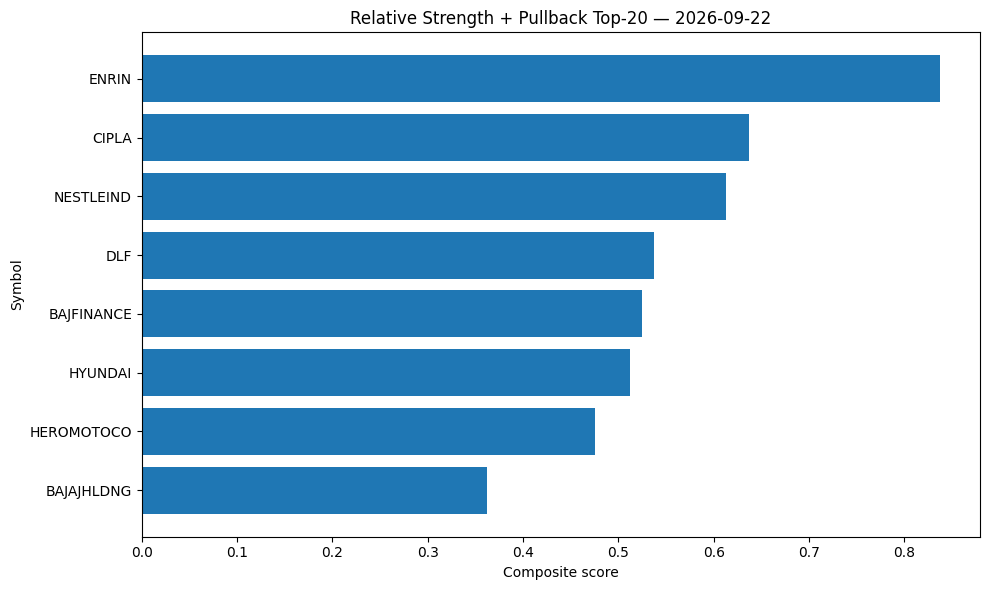

In [13]:
# Visual diagnostic: selected stocks by composite score
if not top20.empty:
    chart = top20.sort_values("composite_score")
    plt.figure(figsize=(10, 6))
    plt.barh(chart["symbol"], chart["composite_score"])
    plt.xlabel("Composite score")
    plt.ylabel("Symbol")
    plt.title(f"Relative Strength + Pullback Top-{TOP_N} — {as_of.date()}")
    plt.tight_layout()
    plt.show()
else:
    print("No stocks currently satisfy the relative strength + pullback rules.")


## 14. Export the current Top-N screen

In [14]:
# 14. Export this month's Top-N screen
stamp = as_of.strftime("%Y%m%d")
output_file = Path(f"Relative_Strength_Pullback_TopN_{stamp}.csv")
export_cols = ["rank","symbol","conviction","Close","dma_200","rs_6m","rs_12m","distance_below_trailing_high_pct","rs_6m_rank","rs_12m_rank","pullback_rank","composite_score"]
top20[export_cols].to_csv(output_file,index=False)
print(f"Exported: {output_file.resolve()}")


Exported: /content/Relative_Strength_Pullback_TopN_20260922.csv


## 15. Journey design and timing

## 15. Journey design and timing

The monthly journey is deliberately separated from the current-screen diagnostic. Purchases use the prior month-end screen and execute at the next month's first trading-day open.


## 16. Validate the journey window


In [15]:
# 17. Validate the journey window

start_ts = pd.Timestamp(START_DATE)
end_ts = pd.Timestamp(END_DATE)
if end_ts < start_ts:
    raise ValueError("END_DATE must be on or after START_DATE.")

journey_months = pd.period_range(start_ts, end_ts, freq="M")
n_months = len(journey_months)
if EXPECTED_MONTHS is not None and n_months != EXPECTED_MONTHS:
    raise ValueError(
        f"START_DATE/END_DATE imply {n_months} calendar months, "
        f"but EXPECTED_MONTHS={EXPECTED_MONTHS}. Change the dates or EXPECTED_MONTHS."
    )

print(f"Journey: {start_ts.date()} → {end_ts.date()}")
print(f"Calendar months: {n_months}")
print(f"Initial lump sum: {format_inr(INITIAL_LUMP_SUM)}")
print(f"Monthly SIP: {format_inr(MONTHLY_SIP)}")


Journey: 2016-10-01 → 2026-09-30
Calendar months: 120
Initial lump sum: ₹0
Monthly SIP: ₹1,00,000


## 17. Rebuild the historical signal series

In [16]:
# 19. Historical signal calculations
prices = prices.sort_values(["symbol", "date"]).copy()
prices["rs_6m"] = prices.groupby("symbol")["Close"].transform(lambda s: s.shift(RS_SKIP_DAYS) / s.shift(RS_6M_WINDOW + RS_SKIP_DAYS) - 1)
prices["rs_12m"] = prices.groupby("symbol")["Close"].transform(lambda s: s.shift(RS_SKIP_DAYS) / s.shift(RS_12M_WINDOW + RS_SKIP_DAYS) - 1)
prices["dma_200"] = prices.groupby("symbol")["Close"].transform(lambda s: s.rolling(200, min_periods=200).mean())
prices["trailing_high"] = prices.groupby("symbol")["Close"].transform(lambda s: s.rolling(PULLBACK_LOOKBACK, min_periods=PULLBACK_LOOKBACK).max())
prices["pullback"] = 1 - prices["Close"] / prices["trailing_high"]
prices["trend_filter"] = prices["Close"] > prices["dma_200"]
prices["month"] = prices["date"].dt.to_period("M")
cols_to_drop = ["conviction","conviction_rank","Category"]
prices = prices.drop(columns=[c for c in cols_to_drop if c in prices.columns])
prices = prices.merge(signals[["symbol","conviction","conviction_rank","category"]], on="symbol", how="left")
prices = prices.rename(columns={"category":"Category"})
print(f"Usable price history: {prices['date'].min().date()} → {prices['date'].max().date()}")


Usable price history: 1991-01-02 → 2026-09-22


## 18. Point-in-time monthly screen helpers and journey calendar

In [17]:
# 20. Helper: monthly screen from a specified signal date

def screen_on_date(signal_date, top_n=TOP_N):
    """Return the Relative Strength + Pullback Top-N opportunity set known at signal_date."""
    d = pd.Timestamp(signal_date)
    snap = prices[prices["date"] == d].copy()
    if snap.empty:
        return pd.DataFrame()
    valid = snap[
        snap["trend_filter"] & snap["pullback"].ge(MIN_PULLBACK) &
        snap["rs_6m"].notna() & snap["rs_12m"].notna() & snap["pullback"].notna()
    ].copy()
    if valid.empty: return valid
    valid["rs_6m_rank"] = valid["rs_6m"].rank(method="average", pct=True)
    valid["rs_12m_rank"] = valid["rs_12m"].rank(method="average", pct=True)
    valid["pullback_rank"] = valid["pullback"].rank(method="average", pct=True)
    weight_sum = RS_6M_WEIGHT + RS_12M_WEIGHT + PULLBACK_WEIGHT
    valid["composite_score"] = (RS_6M_WEIGHT*valid["rs_6m_rank"] + RS_12M_WEIGHT*valid["rs_12m_rank"] + PULLBACK_WEIGHT*valid["pullback_rank"]) / weight_sum
    eligible = valid.sort_values(["composite_score","conviction_rank","symbol"],ascending=[False,True,True]).reset_index(drop=True)
    eligible["rank"] = np.arange(1,len(eligible)+1)
    eligible["distance_below_trailing_high_pct"] = eligible["pullback"]
    return eligible.head(top_n).copy()

def last_trading_day_on_or_before(d):
    d = pd.Timestamp(d); valid = prices.loc[prices["date"] <= d, "date"]; return valid.max() if not valid.empty else pd.NaT

def first_trading_day_on_or_after(d):
    d = pd.Timestamp(d); valid = prices.loc[prices["date"] >= d, "date"]; return valid.min() if not valid.empty else pd.NaT

def month_end_trading_day(period):
    return last_trading_day_on_or_before(period.end_time.normalize())

def month_first_trading_day(period):
    return first_trading_day_on_or_after(period.start_time.normalize())


In [18]:
month_rows = []
for p in journey_months:
    month_start = p.start_time.normalize()
    month_end = p.end_time.normalize()
    first_td = month_first_trading_day(p)
    month_end_td = month_end_trading_day(p)
    prior_signal_td = last_trading_day_on_or_before(month_start - pd.Timedelta(days=1))
    screen_td = month_end_trading_day(p)
    # Purchases made during this month are based on the prior month's month-end screen.
    purchase_screen = prior_signal_td
    month_rows.append({
        "month": str(p),
        "month_period": p,
        "month_start": month_start,
        "month_end": month_end,
        "first_trading_day": first_td,
        "month_end_trading_day": month_end_td,
        "purchase_screen_date": purchase_screen,
        "month_end_screen_date": screen_td,
    })

calendar = pd.DataFrame(month_rows)
calendar = calendar[calendar["first_trading_day"].notna() & calendar["month_end_trading_day"].notna()].copy()
display(calendar[["month","first_trading_day","purchase_screen_date","month_end_trading_day"]].head())


,month,first_trading_day,purchase_screen_date,month_end_trading_day
0,2016-10,2016-10-03,2016-09-30,2016-10-28
1,2016-11,2016-11-01,2016-10-28,2016-11-30
2,2016-12,2016-12-01,2016-11-30,2016-12-30
3,2017-01,2017-01-02,2016-12-30,2017-01-31
4,2017-02,2017-02-01,2017-01-31,2017-02-28


## 19. Portfolio engine

The engine follows one monthly state transition: contribution → scheduled trims → new purchases → month-end valuation. All BUY/TRIM quantities are integer shares.

In [19]:

COST_RATE = TRANSACTION_COST_BPS / 10000
SLIPPAGE_RATE = SLIPPAGE_BPS / 10000

close_lookup = prices.set_index(["date", "symbol"])["Close"]
open_lookup = prices.set_index(["date", "symbol"])["Open"]
category_lookup = prices.set_index(["date", "symbol"])["Category"]

cash = 0.0
shares = {}  # symbol -> integer shares held
cashflows = []
trade_rows = []
opportunity_rows = []
month_rows_out = []
audit_rows = []

# Month-end position weights above this threshold trigger a partial trim next month.
trim_queue = set()


def market_value_at(date):
    total = 0.0
    details = []
    for symbol, qty in shares.items():
        try:
            px = float(close_lookup.loc[(date, symbol)])
        except KeyError:
            px = np.nan
        if pd.notna(px):
            mv = qty * px
            total += mv
            details.append((symbol, qty, px, mv))
    return total, details


def xirr(cashflows_df):
    cf = cashflows_df.dropna(subset=["date", "amount"]).copy()
    if len(cf) < 2 or not (cf["amount"] > 0).any() or not (cf["amount"] < 0).any():
        return np.nan
    dates = pd.to_datetime(cf["date"])
    amounts = cf["amount"].astype(float).to_numpy()
    t0 = dates.iloc[0]
    years = np.array([(d - t0).days / 365.25 for d in dates])
    def npv(r):
        if r <= -0.999999:
            return np.inf
        return np.sum(amounts / ((1 + r) ** years))
    lo, hi = -0.9999, 10.0
    flo, fhi = npv(lo), npv(hi)
    if np.sign(flo) == np.sign(fhi):
        for new_hi in [25.0, 50.0, 100.0]:
            hi, fhi = new_hi, npv(new_hi)
            if np.sign(flo) != np.sign(fhi):
                break
    if np.sign(flo) == np.sign(fhi):
        return np.nan
    for _ in range(200):
        mid = (lo + hi) / 2
        fm = npv(mid)
        if abs(fm) < 1e-7:
            return mid
        if np.sign(fm) == np.sign(flo):
            lo, flo = mid, fm
        else:
            hi, fhi = mid, fm
    return (lo + hi) / 2

for month_number, (_, row) in enumerate(calendar.reset_index(drop=True).iterrows()):
    month = row["month"]
    first_td = row["first_trading_day"]
    month_end_td = row["month_end_trading_day"]
    purchase_screen_date = row["purchase_screen_date"]

    contribution = 0.0
    if month_number == 0:
        contribution += float(INITIAL_LUMP_SUM)
        if SIP_IN_FIRST_MONTH:
            contribution += float(MONTHLY_SIP)
    else:
        contribution += float(MONTHLY_SIP)
    cash += contribution

    if contribution > 0:
        cashflows.append({"date": first_td, "amount": -contribution, "type": "contribution"})

    opp = screen_on_date(purchase_screen_date, TOP_N) if pd.notna(purchase_screen_date) else pd.DataFrame()
    if not opp.empty:
        for _, r in opp.iterrows():
            opportunity_rows.append({
                "month": month,
                "screen_date": purchase_screen_date,
                "rank": int(r["rank"]),
                "symbol": r["symbol"],
                "conviction": r["conviction"],
                "category": r["Category"],
                "close_on_screen": float(r["Close"]),
                "dma_200": float(r["dma_200"]),
                "rs_6m": float(r["rs_6m"]),
                "rs_12m": float(r["rs_12m"]),
                "pullback": float(r["pullback"]),
                "rs_6m_rank": float(r["rs_6m_rank"]),
                "rs_12m_rank": float(r["rs_12m_rank"]),
                "pullback_rank": float(r["pullback_rank"]),
                "composite_score": float(r["composite_score"]),
            })

    # Value existing holdings at the first trading-day open.
    pre_mv = 0.0
    first_day_values = {}
    first_day_sectors = {}
    for symbol, qty in shares.items():
        try:
            px = float(open_lookup.loc[(first_td, symbol)])
            sector = str(category_lookup.loc[(first_td, symbol)])
        except KeyError:
            px, sector = np.nan, "Unknown"
        if pd.notna(px) and px > 0:
            mv = qty * px
            pre_mv += mv
            first_day_values[symbol] = mv
            first_day_sectors[sector] = first_day_sectors.get(sector, 0.0) + mv

    pre_equity = cash + pre_mv

    # ------------------------------------------------------------
    # Position-risk trims: only positions that breached the hard
    # concentration threshold at the PREVIOUS month-end are trimmed.
    # This keeps the purchase cap as an entry/addition cap while preventing
    # exceptional winners from becoming unbounded concentration risk.
    # ------------------------------------------------------------
    if month_number > 0 and trim_queue and pre_equity > 0:
        for symbol in sorted(trim_queue):
            qty_existing = int(shares.get(symbol, 0))
            if qty_existing <= 0 or symbol not in first_day_values:
                continue
            open_px = float(open_lookup.loc[(first_td, symbol)])
            current_mv = qty_existing * open_px
            target_mv = pre_equity * POSITION_TRIM_TARGET_PCT
            trim_value = max(0.0, current_mv - target_mv)
            if trim_value <= 1e-8:
                continue

            effective_px = open_px * (1 - SLIPPAGE_RATE)
            # Indian cash-equity trading uses whole shares only.
            qty_to_sell = min(qty_existing, int(np.floor(trim_value / effective_px + 1e-12)))
            gross_proceeds = qty_to_sell * effective_px
            transaction_cost = gross_proceeds * COST_RATE
            net_proceeds = gross_proceeds - transaction_cost
            if qty_to_sell <= 0 or net_proceeds <= 0:
                continue

            shares[symbol] = int(qty_existing - qty_to_sell)
            cash += net_proceeds
            trade_rows.append({
                "month": month,
                "trade_date": first_td,
                "screen_date": purchase_screen_date,
                "rank": np.nan,
                "symbol": symbol,
                "conviction": "Position Risk Trim",
                "category": str(category_lookup.loc[(first_td, symbol)]),
                "action": "TRIM",
                "shares_bought": -qty_to_sell,
                "open_price": open_px,
                "effective_price": effective_px,
                "gross_investment": -gross_proceeds,
                "transaction_cost": transaction_cost,
                "total_cash_out": -net_proceeds,
                "post_trade_cap": pre_equity * POSITION_HARD_PCT,
                "risk_threshold": POSITION_HARD_PCT,
                "trim_target": POSITION_TRIM_TARGET_PCT,
            })

            # Refresh first-day value after the trim so subsequent purchases
            # use the correct available cash and position size.
            first_day_values[symbol] = shares[symbol] * open_px

        trim_queue = set()

    # Recalculate equity/caps after any risk trims and before new purchases.
    pre_mv = sum(first_day_values.values())
    pre_equity = cash + pre_mv
    cap_value = pre_equity * MAX_POSITION_PCT
    sector_cap_value = pre_equity * MAX_SECTOR_PCT
    available = cash

    sector_values = {}
    for held_symbol, held_qty in shares.items():
        try:
            held_px = float(open_lookup.loc[(first_td, held_symbol)])
            held_sector = str(category_lookup.loc[(first_td, held_symbol)])
        except KeyError:
            continue
        if pd.notna(held_px) and held_px > 0:
            sector_values[held_sector] = sector_values.get(held_sector, 0.0) + held_qty * held_px

    if not opp.empty and available > 0:
        # X-LC is always preferred over H-LC for allocation, while the selected
        # opportunity set remains strategy-specific. Capital is allocated as
        # equally as possible across all candidates with remaining capacity.
        alloc_opp = opp.copy()
        alloc_opp["conviction_priority"] = alloc_opp["conviction_rank"].fillna(99)
        alloc_opp = alloc_opp.sort_values(["conviction_priority", "rank", "symbol"], ascending=[True, True, True]).reset_index(drop=True)
        active = list(alloc_opp["symbol"])
        meta = {r["symbol"]: r for _, r in alloc_opp.iterrows()}

        # Repeated passes redistribute excess cash created by stock/sector caps
        # or integer-share rounding. Both strategies use the same utilization
        # rule: retain only the 5% strategic cash buffer; deploy the remainder
        # whenever eligible opportunities have capacity. This is a capital-
        # utilization rule, not a change to the strategy's stock-selection logic.
        while active and cash > 0:
            reserve = pre_equity * TARGET_CASH_BUFFER_PCT
            deployable = max(0.0, cash - reserve)
            if deployable <= 1e-8:
                break
            target_each = deployable / len(active)
            progress = False
            next_active = []
            for symbol in active:
                if cash <= reserve + 1e-8:
                    break
                r = meta[symbol]
                if symbol not in set(signals["symbol"]):
                    continue
                qty_existing = int(shares.get(symbol, 0))
                # Common capital-utilization rule: existing qualifying holdings may
                # be topped up to the same 5% cap; new names require a free slot.
                if qty_existing <= 0 and len(shares) >= MAX_HOLDINGS:
                    continue
                if qty_existing > 0 and not ALLOW_REPEAT_BUYS:
                    continue
                if symbol not in open_lookup.index.get_level_values(1):
                    continue
                try:
                    open_px = float(open_lookup.loc[(first_td, symbol)])
                except KeyError:
                    continue
                if not np.isfinite(open_px) or open_px <= 0:
                    continue
                sector = str(r["Category"])
                existing_mv = qty_existing * open_px
                room = max(0.0, cap_value - existing_mv)
                current_sector_value = sector_values.get(sector, 0.0)
                sector_room = max(0.0, sector_cap_value - current_sector_value)
                gross_budget = min(room, sector_room, cash - reserve, target_each)
                if gross_budget <= 1e-8:
                    continue
                effective_px = open_px * (1 + SLIPPAGE_RATE)
                qty = int(np.floor(min(gross_budget / effective_px, (cash - reserve) / (effective_px * (1 + COST_RATE))) + 1e-12))
                consideration = qty * effective_px
                transaction_cost = consideration * COST_RATE
                total_cash = consideration + transaction_cost
                if qty <= 0 or total_cash <= 0:
                    # Keep it only if it may become buyable after redistribution.
                    next_active.append(symbol)
                    continue
                shares[symbol] = int(qty_existing + qty)
                sector_values[sector] = sector_values.get(sector, 0.0) + consideration
                cash -= total_cash
                available = cash
                progress = True
                trade_rows.append({
                    "month": month, "trade_date": first_td, "screen_date": purchase_screen_date,
                    "rank": int(r["rank"]), "symbol": symbol, "conviction": r["conviction"],
                    "category": sector, "action": "BUY", "shares_bought": qty, "open_price": open_px,
                    "effective_price": effective_px, "gross_investment": consideration,
                    "transaction_cost": transaction_cost, "total_cash_out": total_cash,
                    "post_trade_cap": cap_value, "risk_threshold": np.nan, "trim_target": np.nan,
                })
                next_active.append(symbol)
            if not progress:
                break
            active = next_active

    if not all(float(qty).is_integer() and qty >= 0 for qty in shares.values()):
        raise AssertionError(f"Integer-share invariant failed in {month}: {shares}")
    if cash < -1e-6:
        raise AssertionError(f"Negative cash invariant failed in {month}: {cash}")

    equity_value, holding_details = market_value_at(month_end_td)
    portfolio_value = cash + equity_value
    contributed = INITIAL_LUMP_SUM + MONTHLY_SIP * (month_number if not SIP_IN_FIRST_MONTH else month_number + 1)
    profit = portfolio_value - contributed
    profit_pct = profit / contributed if contributed else np.nan

    external_cf = [x for x in cashflows if x["type"] == "contribution"]
    cf = pd.DataFrame(external_cf + [{"date": month_end_td, "amount": portfolio_value, "type": "terminal_mark"}])
    current_xirr = xirr(cf)

    invested_pct = equity_value / portfolio_value if portfolio_value else 0.0
    cash_pct = cash / portfolio_value if portfolio_value else 0.0
    utilization_target_met = bool(cash_pct <= TARGET_CASH_BUFFER_PCT + 0.005)
    month_sector_values = {}
    month_stock_weights = {}
    for symbol, qty, px, mv in holding_details:
        try:
            sector = str(category_lookup.loc[(month_end_td, symbol)])
        except KeyError:
            sector = "Unknown"
        month_sector_values[sector] = month_sector_values.get(sector, 0.0) + mv
        month_stock_weights[symbol] = mv / portfolio_value if portfolio_value else 0.0

    max_sector_weight = (max(month_sector_values.values()) / portfolio_value) if month_sector_values and portfolio_value else 0.0
    max_sector_name = max(month_sector_values, key=month_sector_values.get) if month_sector_values else None
    max_stock_weight = max(month_stock_weights.values()) if month_stock_weights else 0.0
    max_stock_name = max(month_stock_weights, key=month_stock_weights.get) if month_stock_weights else None

    # Queue any hard-limit breaches observed at month-end for the next
    # month's first trading day. Review-zone positions are reported only.
    trim_queue = {s for s, w in month_stock_weights.items() if w > POSITION_HARD_PCT}

    cumulative_deployed = sum(t["total_cash_out"] for t in trade_rows if t["trade_date"] <= month_end_td and t["action"] == "BUY")
    cumulative_trim_proceeds = -sum(t["total_cash_out"] for t in trade_rows if t["trade_date"] <= month_end_td and t["action"] == "TRIM")
    month_rows_out.append({
        "month": month,
        "screen_date_for_month_end": row["month_end_screen_date"],
        "purchase_screen_date": purchase_screen_date,
        "first_trading_day": first_td,
        "month_end": month_end_td,
        "contribution_this_month": contribution,
        "cumulative_contributed": contributed,
        "gross_invested_value": equity_value,
        "cumulative_deployed": cumulative_deployed,
        "cumulative_trim_proceeds": cumulative_trim_proceeds,
        "cash_left": cash,
        "portfolio_value": portfolio_value,
        "invested_pct": invested_pct,
        "cash_pct": cash_pct,
        "utilization_target_met": utilization_target_met,
        "max_stock_weight": max_stock_weight,
        "max_stock": max_stock_name,
        "max_sector_weight": max_sector_weight,
        "max_sector": max_sector_name,
        "absolute_profit": profit,
        "absolute_profit_pct": profit_pct,
        "xirr": current_xirr,
        "num_holdings": len([x for x in holding_details if x[3] > 0]),
        "buy_events_this_month": sum(1 for t in trade_rows if t["month"] == month and t["action"] == "BUY"),
        "trim_events_this_month": sum(1 for t in trade_rows if t["month"] == month and t["action"] == "TRIM"),
        "eligible_opportunities": len(opp),
    })

    # Compact accounting/risk audit for this month.
    month_trades = [t for t in trade_rows if t["month"] == month]
    buy_cash = sum(t["total_cash_out"] for t in month_trades if t["action"] == "BUY")
    trim_cash = -sum(t["total_cash_out"] for t in month_trades if t["action"] == "TRIM")
    integer_ok = all(float(qty).is_integer() and qty >= 0 for qty in shares.values())
    cash_ok = cash >= -1e-6
    audit_rows.append({
        "month": month,
        "integer_shares_ok": integer_ok,
        "negative_cash_ok": cash_ok,
        "buy_cash": buy_cash,
        "trim_proceeds": trim_cash,
        "closing_cash": cash,
        "portfolio_value": portfolio_value,
        "buy_events": sum(1 for t in month_trades if t["action"] == "BUY"),
        "trim_events": sum(1 for t in month_trades if t["action"] == "TRIM"),
    })

monthly_journey = pd.DataFrame(month_rows_out)
trades = pd.DataFrame(trade_rows)
opportunities = pd.DataFrame(opportunity_rows)

print(f"Months simulated: {len(monthly_journey)}")
print(f"Buy events: {sum(trades['action'].eq('BUY')) if not trades.empty else 0:,}")
print(f"Trim events: {sum(trades['action'].eq('TRIM')) if not trades.empty else 0:,}")
print(f"Opportunity observations: {len(opportunities):,}")


# Final engine objects
audit = pd.DataFrame(audit_rows)


Months simulated: 120
Buy events: 2,010
Trim events: 0
Opportunity observations: 914


## 20. Portfolio validation and audit

In [20]:
def run_portfolio_audit():
    checks = []
    checks.append(("Configuration valid", True))
    checks.append(("Expected journey months", len(monthly_journey) == len(journey_months)))
    checks.append(("Integer shares throughout", bool(audit["integer_shares_ok"].all()) if not audit.empty else True))
    checks.append(("No negative cash", bool(audit["negative_cash_ok"].all()) if not audit.empty else True))
    checks.append(("No negative holdings", all(float(q) >= 0 for q in shares.values())))
    checks.append(("No fractional holdings", all(float(q).is_integer() for q in shares.values())))
    checks.append(("No look-ahead in purchase screens", bool((pd.to_datetime(calendar["purchase_screen_date"]) < pd.to_datetime(calendar["first_trading_day"])).all())) )
    checks.append(("Trade ledger present", True))

    audit_table = pd.DataFrame(checks, columns=["check", "passed"])
    display(audit_table.style.format({"passed": lambda x: "✓" if x else "✗"}))
    if not audit_table["passed"].all():
        failed = audit_table.loc[~audit_table["passed"], "check"].tolist()
        raise AssertionError(f"Portfolio audit failed: {failed}")
    print("Audit status: PASS")

run_portfolio_audit()
print(f"Data fingerprint: {DATA_FINGERPRINT}")


,check,passed
0,Configuration valid,✓
1,Expected journey months,✓
2,Integer shares throughout,✓
3,No negative cash,✓
4,No negative holdings,✓
5,No fractional holdings,✓
6,No look-ahead in purchase screens,✓
7,Trade ledger present,✓


Audit status: PASS
Data fingerprint: a151a5c174d7435d


## 21. Month-by-month journey results

In [21]:
# 25. Main month-by-month table

journey_view = monthly_journey.copy()
display(journey_view.style.format({
    "contribution_this_month": format_inr,
    "cumulative_contributed": format_inr,
    "cumulative_deployed": format_inr,
    "gross_invested_value": format_inr,
    "cash_left": format_inr,
    "portfolio_value": format_inr,
    "invested_pct": "{:.1%}",
    "cash_pct": "{:.1%}",
    "max_sector_weight": "{:.1%}",
    "absolute_profit": format_inr,
    "absolute_profit_pct": "{:.1%}",
    "xirr": "{:.1%}",
}))


,month,screen_date_for_month_end,purchase_screen_date,first_trading_day,month_end,contribution_this_month,cumulative_contributed,gross_invested_value,cumulative_deployed,cumulative_trim_proceeds,cash_left,portfolio_value,invested_pct,cash_pct,utilization_target_met,max_stock_weight,max_stock,max_sector_weight,max_sector,absolute_profit,absolute_profit_pct,xirr,num_holdings,buy_events_this_month,trim_events_this_month,eligible_opportunities
0,2016-10,2016-10-28 00:00:00,2016-09-30 00:00:00,2016-10-03 00:00:00,2016-10-28 00:00:00,"₹1,00,000","₹1,00,000","₹40,293","₹38,874",0,"₹61,126","₹1,01,419",39.7%,60.3%,False,0.057372,ADANIPORTS,9.8%,PHARMA,"₹1,419",1.4%,22.9%,8,8,0,9
1,2016-11,2016-11-30 00:00:00,2016-10-28 00:00:00,2016-11-01 00:00:00,2016-11-30 00:00:00,"₹1,00,000","₹2,00,000","₹65,565","₹68,770",0,"₹1,31,230","₹1,96,794",33.3%,66.7%,False,0.052830,JSWSTEEL,7.3%,PHARMA,"₹-3,206",-1.6%,-12.7%,10,4,0,5
2,2016-12,2016-12-30 00:00:00,2016-11-30 00:00:00,2016-12-01 00:00:00,2016-12-30 00:00:00,"₹1,00,000","₹3,00,000","₹2,60,644","₹2,76,150",0,"₹23,850","₹2,84,494",91.6%,8.4%,False,0.054148,ITC,20.8%,AUTO,"₹-15,506",-5.2%,-28.2%,24,34,0,17
3,2017-01,2017-01-31 00:00:00,2016-12-30 00:00:00,2017-01-02 00:00:00,2017-01-31 00:00:00,"₹1,00,000","₹4,00,000","₹3,91,437","₹3,76,273",0,"₹23,727","₹4,15,163",94.3%,5.7%,False,0.056542,JSWSTEEL,18.2%,AUTO,"₹15,163",3.8%,19.7%,27,29,0,10
4,2017-02,2017-02-28 00:00:00,2017-01-31 00:00:00,2017-02-01 00:00:00,2017-02-28 00:00:00,"₹1,00,000","₹5,00,000","₹4,92,526","₹4,65,942",0,"₹34,058","₹5,26,584",93.5%,6.5%,False,0.052225,GRASIM,17.4%,FINANCE,"₹26,584",5.3%,23.8%,28,19,0,9
5,2017-03,2017-03-31 00:00:00,2017-02-28 00:00:00,2017-03-01 00:00:00,2017-03-31 00:00:00,"₹1,00,000","₹6,00,000","₹6,08,393","₹5,64,520",0,"₹35,480","₹6,43,873",94.5%,5.5%,False,0.051329,ABB,16.2%,AUTO,"₹43,873",7.3%,27.8%,30,9,0,4
6,2017-04,2017-04-28 00:00:00,2017-03-31 00:00:00,2017-04-03 00:00:00,2017-04-28 00:00:00,"₹1,00,000","₹7,00,000","₹7,36,237","₹6,58,815",0,"₹41,185","₹7,77,423",94.7%,5.3%,True,0.059957,DLF,16.8%,AUTO,"₹77,423",11.1%,38.2%,31,15,0,5
7,2017-05,2017-05-31 00:00:00,2017-04-28 00:00:00,2017-05-02 00:00:00,2017-05-31 00:00:00,"₹1,00,000","₹8,00,000","₹7,98,410","₹7,02,599",0,"₹97,401","₹8,95,811",89.1%,10.9%,False,0.051873,M&M,20.8%,AUTO,"₹95,811",12.0%,35.3%,32,1,0,1
8,2017-06,2017-06-30 00:00:00,2017-05-31 00:00:00,2017-06-01 00:00:00,2017-06-30 00:00:00,"₹1,00,000","₹9,00,000","₹8,53,072","₹7,52,141",0,"₹1,47,859","₹10,00,930",85.2%,14.8%,False,0.052624,DLF,18.0%,AUTO,"₹1,00,930",11.2%,29.1%,32,2,0,2
9,2017-07,2017-07-31 00:00:00,2017-06-30 00:00:00,2017-07-03 00:00:00,2017-07-31 00:00:00,"₹1,00,000","₹10,00,000","₹10,32,251","₹8,70,438",0,"₹1,29,562","₹11,61,814",88.8%,11.2%,False,0.057329,BAJAJFINSV,16.1%,AUTO,"₹1,61,814",16.2%,38.3%,32,7,0,6


## 22. Opportunity history


In [22]:
# Monthly opportunity table
if opportunities.empty:
    print("No qualifying opportunities in the journey window.")
else:
    display(opportunities.style.format({
        "close_on_screen": lambda x: format_inr(x, 2),
        "dma_200": lambda x: format_inr(x, 2),
        "pullback": "{:.1%}", "rs_6m": "{:.1%}", "rs_12m": "{:.1%}",
        "rs_6m_rank": "{:.3f}", "rs_12m_rank": "{:.3f}", "pullback_rank": "{:.3f}", "composite_score": "{:.3f}",
    }))


,month,screen_date,rank,symbol,conviction,category,close_on_screen,dma_200,rs_6m,rs_12m,pullback,rs_6m_rank,rs_12m_rank,pullback_rank,composite_score
0,2016-10,2016-09-30 00:00:00,1,DLF,H-LC,REALTY,₹133.67,₹115.87,94.1%,30.2%,12.9%,1.000,1.000,0.556,0.822
1,2016-10,2016-09-30 00:00:00,2,AXISBANK,X-LC,BANKS,₹532.78,₹476.94,54.3%,7.7%,14.9%,0.889,0.778,0.667,0.767
2,2016-10,2016-09-30 00:00:00,3,ADANIPORTS,X-LC,MISC,₹243.31,₹216.15,32.0%,-27.7%,22.5%,0.556,0.111,1.000,0.600
3,2016-10,2016-09-30 00:00:00,4,CIPLA,X-LC,PHARMA,₹540.06,₹506.43,12.1%,-17.2%,16.4%,0.222,0.333,0.889,0.522
4,2016-10,2016-09-30 00:00:00,5,NESTLEIND,X-LC,FMCG,₹284.14,₹264.92,29.5%,10.7%,11.0%,0.444,0.889,0.222,0.489
5,2016-10,2016-09-30 00:00:00,6,BOSCHLTD,X-LC,AUTO,"₹20,494.25","₹18,537.12",50.3%,-1.9%,10.4%,0.778,0.667,0.111,0.478
6,2016-10,2016-09-30 00:00:00,7,ICICIBANK,X-LC,BANKS,₹216.64,₹203.11,39.9%,-14.1%,11.1%,0.667,0.444,0.333,0.467
7,2016-10,2016-09-30 00:00:00,8,ZYDUSLIFE,H-LC,PHARMA,₹357.60,₹315.09,21.0%,-2.6%,11.6%,0.333,0.556,0.444,0.444
8,2016-10,2016-09-30 00:00:00,9,HCLTECH,X-LC,IT,₹299.07,₹293.69,-3.1%,-19.4%,16.2%,0.111,0.222,0.778,0.411
9,2016-11,2016-10-28 00:00:00,1,JSWSTEEL,H-LC,STEEL,₹148.88,₹127.12,43.8%,78.1%,10.9%,1.000,1.000,0.400,0.760


## 23. Trade ledger

In [23]:
# 29. Trade ledger

if trades.empty:
    print("No trades were generated.")
else:
    display(trades.style.format({
        "shares_bought": "{:,.0f}",
        "open_price": lambda x: format_inr(x, 2),
        "effective_price": lambda x: format_inr(x, 2),
        "gross_investment": format_inr,
        "transaction_cost": format_inr,
        "total_cash_out": format_inr,
        "post_trade_cap": format_inr,
    }))


,month,trade_date,screen_date,rank,symbol,conviction,category,action,shares_bought,open_price,effective_price,gross_investment,transaction_cost,total_cash_out,post_trade_cap,risk_threshold,trim_target
0,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,2,AXISBANK,X-LC,BANKS,BUY,9,₹534.36,₹534.62,"₹4,812",₹5,"₹4,816","₹5,000",nan,nan
1,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,3,ADANIPORTS,X-LC,MISC,BUY,20,₹247.05,₹247.18,"₹4,944",₹5,"₹4,949","₹5,000",nan,nan
2,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,4,CIPLA,X-LC,PHARMA,BUY,9,₹544.39,₹544.67,"₹4,902",₹5,"₹4,907","₹5,000",nan,nan
3,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,5,NESTLEIND,X-LC,FMCG,BUY,17,₹284.14,₹284.28,"₹4,833",₹5,"₹4,838","₹5,000",nan,nan
4,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,7,ICICIBANK,X-LC,BANKS,BUY,23,₹215.65,₹215.76,"₹4,962",₹5,"₹4,967","₹5,000",nan,nan
5,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,9,HCLTECH,X-LC,IT,BUY,16,₹300.97,₹301.12,"₹4,818",₹5,"₹4,823","₹5,000",nan,nan
6,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,1,DLF,H-LC,REALTY,BUY,36,₹135.36,₹135.43,"₹4,875",₹5,"₹4,880","₹5,000",nan,nan
7,2016-10,2016-10-03 00:00:00,2016-09-30 00:00:00,8,ZYDUSLIFE,H-LC,PHARMA,BUY,13,₹360.55,₹360.73,"₹4,689",₹5,"₹4,694","₹5,000",nan,nan
8,2016-11,2016-11-01 00:00:00,2016-10-28 00:00:00,2,ASIANPAINT,X-LC,PAINTS,BUY,10,₹992.21,₹992.71,"₹9,927",₹10,"₹9,937","₹10,073",nan,nan
9,2016-11,2016-11-01 00:00:00,2016-10-28 00:00:00,3,CIPLA,X-LC,PHARMA,BUY,9,₹539.51,₹539.77,"₹4,858",₹5,"₹4,863","₹10,073",nan,nan


## 24. Month-end holdings and compact portfolio snapshot

In [24]:
# 30. End-of-month portfolio holdings

holding_rows = []
for _, mr in monthly_journey.iterrows():
    d = mr["month_end"]
    for symbol, qty in shares.items():
        try:
            px = float(close_lookup.loc[(d, symbol)])
        except KeyError:
            continue
        # Reconstruct shares held through the trade ledger up to this month-end.
        if not trades.empty:
            q = trades.loc[trades["trade_date"] <= d].groupby("symbol")["shares_bought"].sum().get(symbol, 0.0)
        else:
            q = 0.0
        if q > 0:
            holding_rows.append({
                "month": mr["month"],
                "month_end": d,
                "symbol": symbol,
                "shares": q,
                "close": px,
                "market_value": q * px,
                "portfolio_weight": (q * px) / mr["portfolio_value"] if mr["portfolio_value"] else np.nan,
            })

monthly_holdings = pd.DataFrame(holding_rows)
if not monthly_holdings.empty:
    display(monthly_holdings.style.format({
        "shares": "{:,.0f}",
        "close": lambda x: format_inr(x, 2),
        "market_value": format_inr,
        "portfolio_weight": "{:.1%}",
    }))
else:
    print("No holdings to display.")


,month,month_end,symbol,shares,close,market_value,portfolio_weight
0,2016-10,2016-10-28 00:00:00,AXISBANK,9,₹479.19,"₹4,313",4.3%
1,2016-10,2016-10-28 00:00:00,ADANIPORTS,20,₹290.93,"₹5,819",5.7%
2,2016-10,2016-10-28 00:00:00,CIPLA,9,₹535.50,"₹4,820",4.8%
3,2016-10,2016-10-28 00:00:00,NESTLEIND,17,₹308.56,"₹5,246",5.2%
4,2016-10,2016-10-28 00:00:00,ICICIBANK,23,₹237.86,"₹5,471",5.4%
5,2016-10,2016-10-28 00:00:00,HCLTECH,16,₹287.51,"₹4,600",4.5%
6,2016-10,2016-10-28 00:00:00,DLF,36,₹137.65,"₹4,955",4.9%
7,2016-10,2016-10-28 00:00:00,ZYDUSLIFE,13,₹390.01,"₹5,070",5.0%
8,2016-11,2016-11-30 00:00:00,AXISBANK,9,₹462.41,"₹4,162",2.1%
9,2016-11,2016-11-30 00:00:00,ADANIPORTS,20,₹263.35,"₹5,267",2.7%


In [25]:
# 36. Detailed month-end holdings snapshot

snapshot_rows = []
if not trades.empty:
    for _, mr in monthly_journey.iterrows():
        d = mr["month_end"]
        prior = trades[trades["trade_date"] <= d]
        for symbol, g in prior.groupby("symbol"):
            qty = g["shares_bought"].sum()
            buy_cash = g.loc[g["action"] == "BUY", "total_cash_out"].sum() if "action" in g.columns else g["total_cash_out"].sum()
            buy_shares = g.loc[g["action"] == "BUY", "shares_bought"].sum() if "action" in g.columns else g["shares_bought"].sum()
            avg_purchase_price = buy_cash / buy_shares if buy_shares else np.nan
            trim_proceeds = -g.loc[g["action"] == "TRIM", "total_cash_out"].sum() if "action" in g.columns else 0.0
            try:
                px = float(close_lookup.loc[(d, symbol)])
            except KeyError:
                continue
            try:
                sector = str(category_lookup.loc[(d, symbol)])
            except KeyError:
                sector = str(g["category"].iloc[-1]) if "category" in g.columns else "Unknown"
            mv = qty * px
            pnl = mv + trim_proceeds - buy_cash
            snapshot_rows.append({
                "month": mr["month"], "month_end": d, "symbol": symbol,
                "category": sector, "conviction": (g.loc[g["action"] == "BUY", "conviction"].iloc[-1] if "action" in g.columns and (g["action"] == "BUY").any() else g["conviction"].iloc[-1]),
                "shares": qty, "avg_purchase_price": avg_purchase_price, "month_end_price": px, "market_value": mv,
                "portfolio_weight": mv / mr["portfolio_value"] if mr["portfolio_value"] else np.nan,
                "cumulative_total_cash_out": buy_cash,
                "cumulative_trim_proceeds": trim_proceeds,
                "unrealized_pnl": pnl,
                "unrealized_pnl_pct": pnl / buy_cash if buy_cash else np.nan,
                "net_pnl_after_trims": pnl,
                "net_pnl_after_trims_pct": pnl / buy_cash if buy_cash else np.nan,
            })

monthly_holdings_snapshot = pd.DataFrame(snapshot_rows)
if monthly_holdings_snapshot.empty:
    print("No month-end holdings were generated.")
else:
    monthly_holdings_snapshot = monthly_holdings_snapshot.sort_values(["month_end","market_value"], ascending=[True,False]).reset_index(drop=True)
    display(monthly_holdings_snapshot.style.format({
        "shares":"{:,.0f}", "avg_purchase_price":lambda x: format_inr(x, 2), "month_end_price":lambda x: format_inr(x, 2), "market_value":format_inr,
        "portfolio_weight":"{:.1%}", "cumulative_total_cash_out":format_inr,
        "unrealized_pnl":format_inr, "unrealized_pnl_pct":"{:.1%}"
    }))


,month,month_end,symbol,category,conviction,shares,avg_purchase_price,month_end_price,market_value,portfolio_weight,cumulative_total_cash_out,cumulative_trim_proceeds,unrealized_pnl,unrealized_pnl_pct,net_pnl_after_trims,net_pnl_after_trims_pct
0,2016-10,2016-10-28 00:00:00,ADANIPORTS,MISC,X-LC,20,₹247.43,₹290.93,"₹5,819",5.7%,"₹4,949",-0.000000,₹870,17.6%,870.117952,0.175835
1,2016-10,2016-10-28 00:00:00,ICICIBANK,BANKS,X-LC,23,₹215.97,₹237.86,"₹5,471",5.4%,"₹4,967",-0.000000,₹503,10.1%,503.373792,0.101336
2,2016-10,2016-10-28 00:00:00,NESTLEIND,FMCG,X-LC,17,₹284.57,₹308.56,"₹5,246",5.2%,"₹4,838",-0.000000,₹408,8.4%,407.881518,0.084314
3,2016-10,2016-10-28 00:00:00,ZYDUSLIFE,PHARMA,H-LC,13,₹361.09,₹390.01,"₹5,070",5.0%,"₹4,694",-0.000000,₹376,8.0%,375.967525,0.080093
4,2016-10,2016-10-28 00:00:00,DLF,REALTY,H-LC,36,₹135.56,₹137.65,"₹4,955",4.9%,"₹4,880",-0.000000,₹75,1.5%,75.002197,0.015368
5,2016-10,2016-10-28 00:00:00,CIPLA,PHARMA,X-LC,9,₹545.21,₹535.50,"₹4,820",4.8%,"₹4,907",-0.000000,₹-87,-1.8%,-87.376265,-0.017807
6,2016-10,2016-10-28 00:00:00,HCLTECH,IT,X-LC,16,₹301.43,₹287.51,"₹4,600",4.5%,"₹4,823",-0.000000,₹-223,-4.6%,-222.674767,-0.046171
7,2016-10,2016-10-28 00:00:00,AXISBANK,BANKS,X-LC,9,₹535.16,₹479.19,"₹4,313",4.3%,"₹4,816",-0.000000,₹-504,-10.5%,-503.681675,-0.104576
8,2016-11,2016-11-30 00:00:00,JSWSTEEL,STEEL,H-LC,67,₹149.29,₹155.17,"₹10,397",5.3%,"₹10,003",-0.000000,₹394,3.9%,393.902406,0.039380
9,2016-11,2016-11-30 00:00:00,CIPLA,PHARMA,X-LC,18,₹542.76,₹527.54,"₹9,496",4.8%,"₹9,770",-0.000000,₹-274,-2.8%,-273.987038,-0.028045


In [26]:
compact_rows = []
if not monthly_holdings_snapshot.empty:
    for month, g in monthly_holdings_snapshot.groupby("month", sort=False):
        g = g.sort_values("market_value", ascending=False)
        m = monthly_journey.loc[monthly_journey["month"] == month].iloc[0]
        holdings_text = " | ".join(f"{r.symbol} [{r.category}] {r.portfolio_weight:.1%} {format_inr(r.market_value)}" for r in g.itertuples())
        compact_rows.append({
            "month": month, "portfolio_value": m["portfolio_value"], "cash_left": m["cash_left"],
            "holdings_count": len(g), "max_stock_weight": g["portfolio_weight"].max(),
            "max_sector_weight": m["max_sector_weight"], "holdings": holdings_text
        })
compact_monthly_snapshot = pd.DataFrame(compact_rows)
display(compact_monthly_snapshot)


,month,portfolio_value,cash_left,holdings_count,max_stock_weight,max_sector_weight,holdings
0,2016-10,1.014186e+05,6.112590e+04,8,0.057372,0.097513,"ADANIPORTS [MISC] 5.7% ₹5,819 | ICICIBANK [BAN..."
1,2016-11,1.967942e+05,1.312296e+05,10,0.052830,0.072721,"JSWSTEEL [STEEL] 5.3% ₹10,397 | CIPLA [PHARMA]..."
2,2016-12,2.844942e+05,2.385032e+04,24,0.054148,0.208201,"ITC [FMCG] 5.4% ₹15,405 | CIPLA [PHARMA] 5.2% ..."
3,2017-01,4.151633e+05,2.372657e+04,27,0.056542,0.181584,"JSWSTEEL [STEEL] 5.7% ₹23,474 | HINDALCO [META..."
4,2017-02,5.265840e+05,3.405824e+04,28,0.052225,0.174287,"GRASIM [TEXTILES] 5.2% ₹27,501 | BAJFINANCE [F..."
...,...,...,...,...,...,...,...
115,2026-05,2.973568e+07,1.418597e+06,40,0.053139,0.123575,"CHOLAFIN [FINANCE] 5.3% ₹15,80,135 | HINDALCO ..."
116,2026-06,3.002172e+07,1.500631e+06,40,0.061262,0.134598,"CHOLAFIN [FINANCE] 6.1% ₹18,39,192 | ABB [ELEC..."
117,2026-07,3.173259e+07,1.511885e+06,40,0.059929,0.137668,"CHOLAFIN [FINANCE] 6.0% ₹19,01,697 | ABB [ELEC..."
118,2026-08,3.216791e+07,1.609877e+06,40,0.059358,0.134157,"CHOLAFIN [FINANCE] 5.9% ₹19,09,407 | ABB [ELEC..."


## 25. Sector exposure by month

In [27]:
sector_rows = []
if not monthly_holdings_snapshot.empty:
    for (month, category), g in monthly_holdings_snapshot.groupby(["month","category"]):
        pv = monthly_journey.loc[monthly_journey["month"] == month, "portfolio_value"].iloc[0]
        sector_rows.append({
            "month":month,
            "category":category,
            "market_value":g["market_value"].sum(),
            "portfolio_weight":g["market_value"].sum()/pv if pv else np.nan,
            "stocks_in_sector":g["symbol"].nunique()
        })
sector_snapshot = pd.DataFrame(sector_rows).sort_values(["month","market_value"], ascending=[True,False])
if not sector_snapshot.empty:
    display(sector_snapshot.style.format({"market_value":format_inr,"portfolio_weight":"{:.1%}"}))


,month,category,market_value,portfolio_weight,stocks_in_sector
4,2016-10,PHARMA,"₹9,890",9.8%,2
0,2016-10,BANKS,"₹9,784",9.6%,2
3,2016-10,MISC,"₹5,819",5.7%,1
1,2016-10,FMCG,"₹5,246",5.2%,1
5,2016-10,REALTY,"₹4,955",4.9%,1
2,2016-10,IT,"₹4,600",4.5%,1
11,2016-11,PHARMA,"₹14,311",7.3%,2
13,2016-11,STEEL,"₹10,397",5.3%,1
6,2016-11,BANKS,"₹9,409",4.8%,2
10,2016-11,PAINTS,"₹8,935",4.5%,1


## 26. Portfolio journey charts

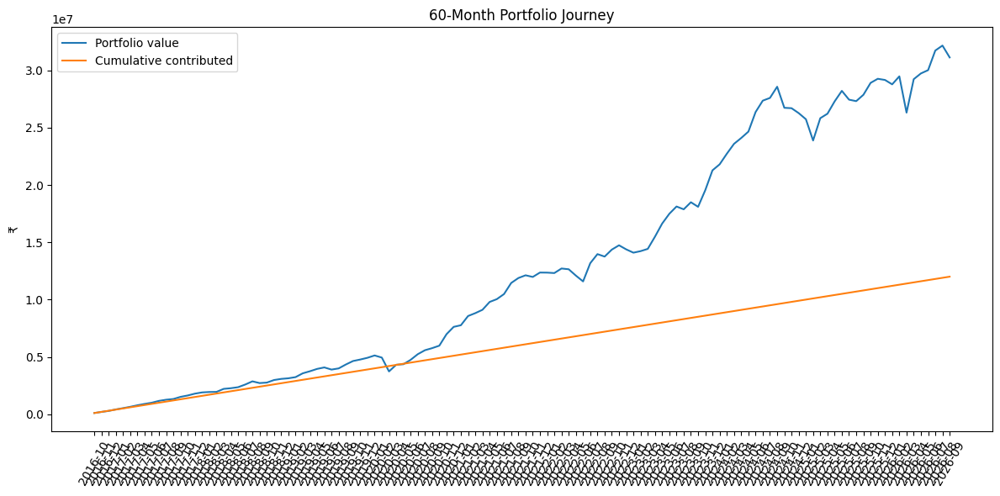

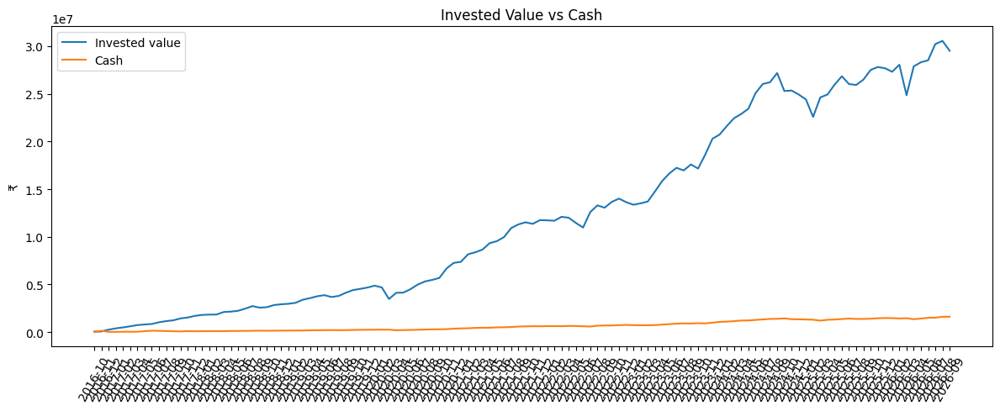

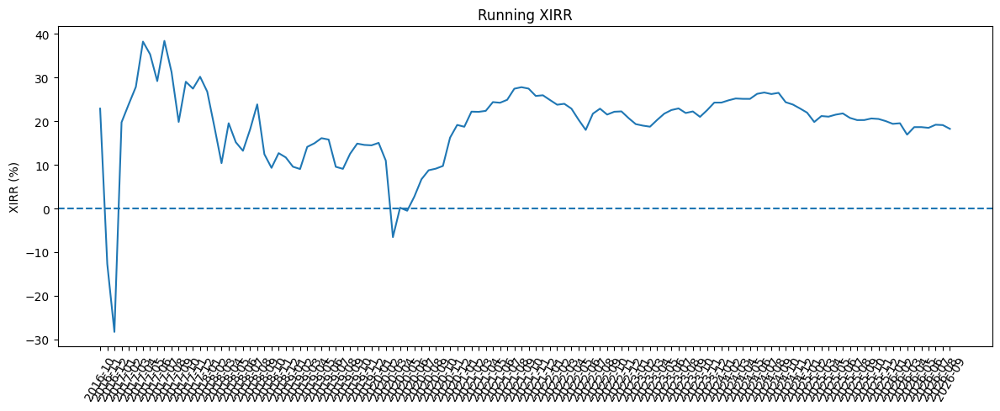

In [28]:
# 32. Portfolio journey charts

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(monthly_journey["month"], monthly_journey["portfolio_value"], label="Portfolio value")
ax.plot(monthly_journey["month"], monthly_journey["cumulative_contributed"], label="Cumulative contributed")
ax.set_title("60-Month Portfolio Journey")
ax.set_ylabel("₹")
ax.tick_params(axis="x", rotation=60)
ax.legend()
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(monthly_journey["month"], monthly_journey["gross_invested_value"], label="Invested value")
ax.plot(monthly_journey["month"], monthly_journey["cash_left"], label="Cash")
ax.set_title("Invested Value vs Cash")
ax.set_ylabel("₹")
ax.tick_params(axis="x", rotation=60)
ax.legend()
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(monthly_journey["month"], monthly_journey["xirr"] * 100)
ax.axhline(0, linestyle="--")
ax.set_title("Running XIRR")
ax.set_ylabel("XIRR (%)")
ax.tick_params(axis="x", rotation=60)
plt.tight_layout()
plt.show()


## 27. Final journey summary

In [29]:
# 33. Final journey summary

last = monthly_journey.iloc[-1]
print("FINAL JOURNEY SUMMARY")
print("=" * 60)
print(f"Journey: {START_DATE} → {END_DATE} ({n_months} months)")
print(f"Initial lump sum: {format_inr(INITIAL_LUMP_SUM)}")
print(f"Monthly SIP: {format_inr(MONTHLY_SIP)}")
print(f"Total contributed: {format_inr(last['cumulative_contributed'])}")
print(f"Cumulative deployed into purchases: {format_inr(last['cumulative_deployed'])}")
print(f"Cumulative trim proceeds: {format_inr(last['cumulative_trim_proceeds'])}")
print(f"Final invested value: {format_inr(last['gross_invested_value'])}")
print(f"Final cash: {format_inr(last['cash_left'])}")
print(f"Final portfolio value: {format_inr(last['portfolio_value'])}")
print(f"Absolute profit: {format_inr(last['absolute_profit'])}")
print(f"Absolute profit %: {last['absolute_profit_pct']:.2%}")
print(f"XIRR: {last['xirr']:.2%}")
print(f"Final invested %: {last['invested_pct']:.2%}")
print(f"Final cash %: {last['cash_pct']:.2%}")
print(f"Cash target <= {TARGET_CASH_BUFFER_PCT:.1%}: {'PASS' if last['utilization_target_met'] else 'NOT MET — check capacity/eligibility constraints'}")
print(f"Final holdings: {int(last['num_holdings'])}")
print(f"Max final sector weight: {last['max_sector_weight']:.2%}")
print(f"Max sector at final month: {last['max_sector']}")
print(f"Sector cap: {MAX_SECTOR_PCT:.2%}")
print(f"Stock purchase cap: {MAX_POSITION_PCT:.2%}")
print(f"Position review threshold: {POSITION_REVIEW_PCT:.2%}")
print(f"Position hard threshold: {POSITION_HARD_PCT:.2%}")
print(f"Position trim target: {POSITION_TRIM_TARGET_PCT:.2%}")
print(f"Total buy events: {sum(trades['action'].eq('BUY')) if not trades.empty else 0:,}")
print(f"Total trim events: {sum(trades['action'].eq('TRIM')) if not trades.empty else 0:,}")
print(f"Data fingerprint: {DATA_FINGERPRINT}")
print("Integer-share trading: PASS")


FINAL JOURNEY SUMMARY
Journey: 2016-10-01 → 2026-09-30 (120 months)
Initial lump sum: ₹0
Monthly SIP: ₹1,00,000
Total contributed: ₹1,20,00,000
Cumulative deployed into purchases: ₹1,03,85,742
Cumulative trim proceeds: ₹0
Final invested value: ₹2,95,16,946
Final cash: ₹16,14,258
Final portfolio value: ₹3,11,31,203
Absolute profit: ₹1,91,31,203
Absolute profit %: 159.43%
XIRR: 18.22%
Final invested %: 94.81%
Final cash %: 5.19%
Cash target <= 5.0%: PASS
Final holdings: 40
Max final sector weight: 13.44%
Max sector at final month: PHARMA
Sector cap: 20.00%
Stock purchase cap: 5.00%
Position review threshold: 12.00%
Position hard threshold: 15.00%
Position trim target: 12.00%
Total buy events: 2,010
Total trim events: 0
Data fingerprint: a151a5c174d7435d
Integer-share trading: PASS


## 28. Export all outputs

In [30]:
# 34. Export the journey tables
stamp = f"{pd.Timestamp(START_DATE):%Y%m%d}_{pd.Timestamp(END_DATE):%Y%m%d}"
monthly_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Monthly_{stamp}.csv")
trade_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Trades_{stamp}.csv")
opp_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Opportunities_{stamp}.csv")
hold_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Holdings_{stamp}.csv")
monthly_journey.to_csv(monthly_file,index=False)
trades.to_csv(trade_file,index=False)
opportunities.to_csv(opp_file,index=False)
monthly_holdings.to_csv(hold_file,index=False)
print("Exported:")
for f in [monthly_file,trade_file,opp_file,hold_file]: print(f" - {f.resolve()}")


Exported:
 - /content/Relative_Strength_Pullback_TopN_Journey_Monthly_20161001_20260930.csv
 - /content/Relative_Strength_Pullback_TopN_Journey_Trades_20161001_20260930.csv
 - /content/Relative_Strength_Pullback_TopN_Journey_Opportunities_20161001_20260930.csv
 - /content/Relative_Strength_Pullback_TopN_Journey_Holdings_20161001_20260930.csv


In [31]:
# 41. Export enhanced outputs
snapshot_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Holdings_Snapshot_{stamp}.csv")
compact_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Monthly_Compact_{stamp}.csv")
sector_file = Path(f"Relative_Strength_Pullback_TopN_Journey_Sector_Snapshot_{stamp}.csv")
monthly_holdings_snapshot.to_csv(snapshot_file,index=False)
compact_monthly_snapshot.to_csv(compact_file,index=False)
sector_snapshot.to_csv(sector_file,index=False)
print("Additional exports:")
for f in [snapshot_file,compact_file,sector_file]: print(f" - {f.resolve()}")


Additional exports:
 - /content/Relative_Strength_Pullback_TopN_Journey_Holdings_Snapshot_20161001_20260930.csv
 - /content/Relative_Strength_Pullback_TopN_Journey_Monthly_Compact_20161001_20260930.csv
 - /content/Relative_Strength_Pullback_TopN_Journey_Sector_Snapshot_20161001_20260930.csv
